In [1]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import numpy as np

*****
**Import JOLTS employment data and Zillow Statistics**
*****

In [2]:
jolts = pd.read_pickle('../Data/JOLTS.pkl')

In [3]:
zillow = pd.read_pickle('../Data/zillow_data.pkl')

In [4]:
jolts.head()

,period_dt,year,period,periodName,state,state_job_openings,state_job_openings_szn_adjd
0,2004-01-01,2004,01,January,Alabama,64,58
1,2004-02-01,2004,02,February,Alabama,49,51
2,2004-03-01,2004,03,March,Alabama,53,53
3,2004-04-01,2004,04,April,Alabama,63,55
4,2004-05-01,2004,05,May,Alabama,60,57


In [5]:
jolts['year'] = jolts['year'].astype(int)
jolts['month'] = jolts['period'].astype(int)
jolts.dtypes

period_dt                      datetime64[ns]
year                                    int32
period                                 object
periodName                             object
state                                  object
state_job_openings                      int32
state_job_openings_szn_adjd             int32
month                                   int32
dtype: object

In [6]:
zillow.head()

,zip_ID,zip_type,state_ID,state_name,state_type,metro_ID,metro_name,metro_type,period,zip_hvi,...,metro_hvi,metro_new_construct,metro_new_listing,metro_for_sale_inventory,metro_rent,metro_med_days_to_close,metro_pct_abv_list,metro_pct_blw_list,metro_pct_w_pricecut,fuzzy_score
0,99501,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,143597.651680,...,136485.429863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,99502,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,146161.464449,...,136485.429863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,99503,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,116638.267029,...,136485.429863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,99504,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,127798.357542,...,136485.429863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,99507,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,148395.120638,...,136485.429863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
zillow['year'] = zillow['period'].dt.year
zillow['month'] = zillow['period'].dt.month
zillow.dtypes

zip_ID                              object
zip_type                            object
state_ID                            object
state_name                          object
state_type                          object
metro_ID                            object
metro_name                          object
metro_type                          object
period                      datetime64[ns]
zip_hvi                            float64
state_hvi                          float64
metro_hvi                          float64
metro_new_construct                float64
metro_new_listing                  float64
metro_for_sale_inventory           float64
metro_rent                         float64
metro_med_days_to_close            float64
metro_pct_abv_list                 float64
metro_pct_blw_list                 float64
metro_pct_w_pricecut               float64
fuzzy_score                        float64
year                                 int32
month                                int32
dtype: obje

*****
**Explore relationships**
*****

In [8]:
calcs = {'state_hvi': 'mean',
        'zip_ID': 'nunique'}

In [9]:
#Find low, mid, high states for mean hvi
state_rank = zillow.groupby('state_name').agg(calcs) \
                    .sort_values(by='state_hvi', ascending=False) \
                    .reset_index()
state_rank.loc[list(range(0,51,5))]

,state_name,state_hvi,zip_ID
0,Hawaii,599376.909641,79
5,Washington,343894.264101,415
10,Connecticut,283246.381673,256
15,Alaska,265825.522484,28
20,Arizona,247238.998805,287
25,North Dakota,217564.821548,65
30,Wisconsin,186397.457918,445
35,South Carolina,173149.565299,308
40,Iowa,148228.250248,398
45,Ohio,136467.414177,906


In [10]:
#Create dictionary with zipcodes of interest for each state
key_zips = {}
for state in state_rank['state_name']:
    state_df = zillow[zillow['state_name'] == state].sort_values(by='zip_hvi')
    count = len(state_df)-1
    quantiles = [0,int(count*.25),int(count*.5),int(count*.75),count]
    key_zips[state] = list(state_df['zip_ID'].iloc[quantiles])

print(key_zips)

{'Hawaii': ['96752', '96727', '96821', '96761', '96714'], 'District of Columbia': ['20032', '20032', '20011', '20001', '20008'], 'California': ['93562', '93535', '94589', '94080', '94027'], 'Massachusetts': ['01570', '01535', '01060', '01824', '02108'], 'New Jersey': ['08104', '07420', '07601', '08534', '07723'], 'Washington': ['99341', '98605', '98032', '98288', '98039'], 'Colorado': ['81025', '80648', '81520', '80483', '81611'], 'Maryland': ['21223', '21822', '21132', '21084', '21056'], 'Oregon': ['97737', '97058', '97055', '97456', '97034'], 'Utah': ['84722', '84119', '84315', '84075', '84060'], 'Connecticut': ['06519', '06242', '06379', '06477', '06830'], 'Rhode Island': ['02907', '02916', '02864', '02881', '02807'], 'New Hampshire': ['03570', '03304', '03063', '03242', '03871'], 'Montana': ['59414', '59847', '59006', '59105', '59716'], 'Nevada': ['89030', '89883', '89705', '89161', '89413'], 'Alaska': ['99503', '99623', '99503', '99587', '99516'], 'New York': ['12952', '13322', '1

In [11]:
explore_states = state_rank.loc[[0,23,25,50]]
explore_states

,state_name,state_hvi,zip_ID
0,Hawaii,599376.909641,79
23,Minnesota,223687.095448,520
25,North Dakota,217564.821548,65
50,West Virginia,114544.538556,303


In [12]:
explore_zips = []
for state in explore_states['state_name']:
    explore_zips.extend(key_zips[state])

print(explore_zips)

['96752', '96727', '96821', '96761', '96714', '56032', '55720', '55352', '56736', '55424', '58053', '58201', '58104', '58278', '58521', '24736', '25143', '26104', '26150', '25442']


In [13]:
explore_zillow = zillow[zillow['zip_ID'].isin(explore_zips)]

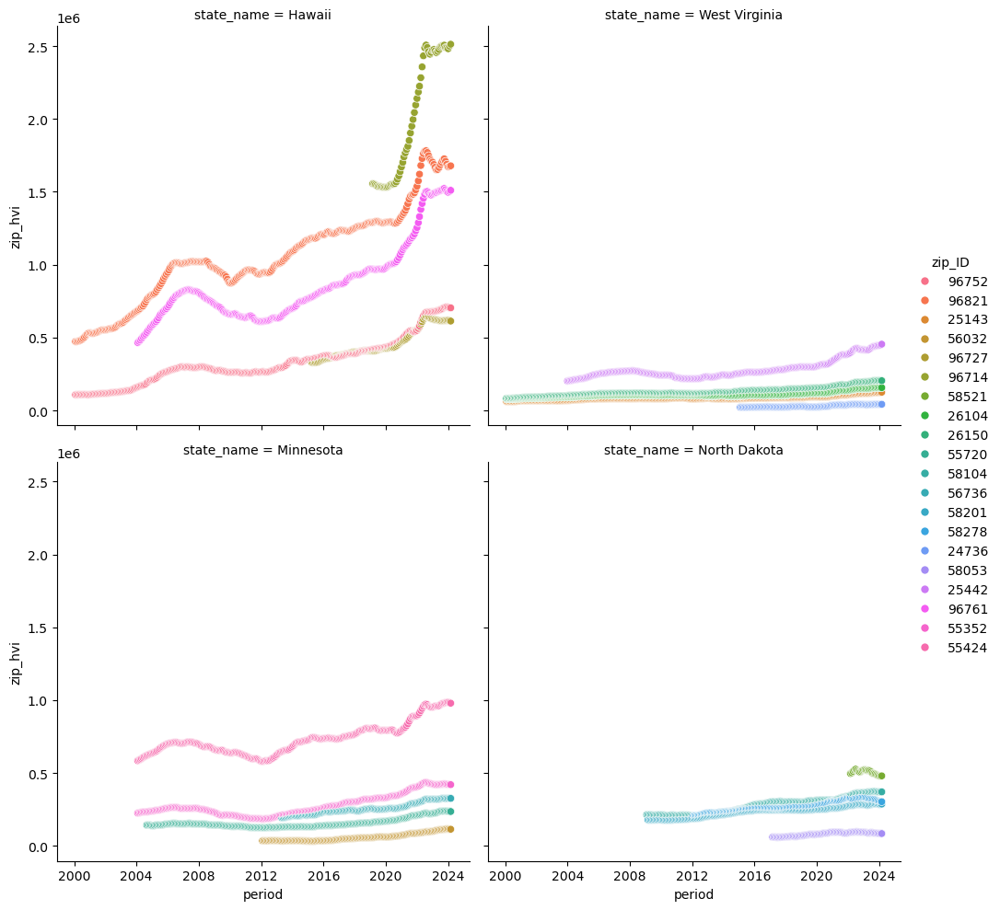

In [14]:
sns.relplot(data=explore_zillow, kind='scatter', \
            x='period', y='zip_hvi', hue='zip_ID', col='state_name', col_wrap=2)
plt.show()

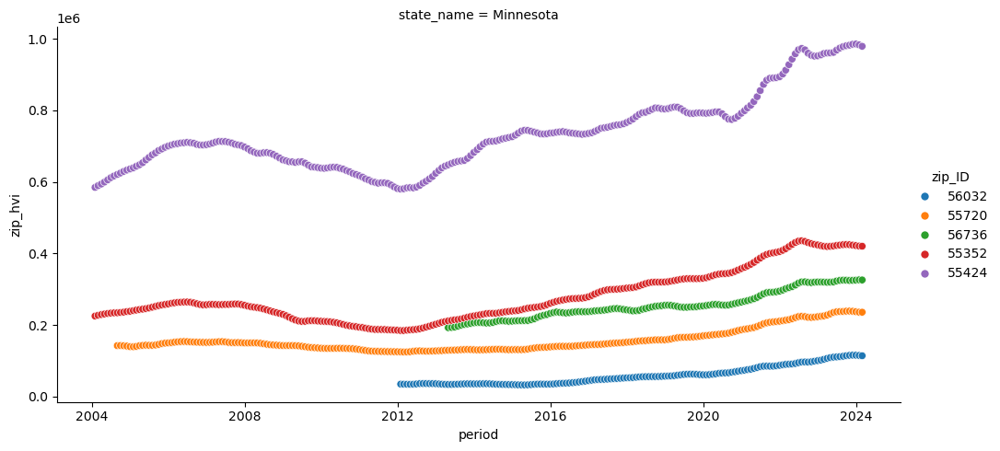

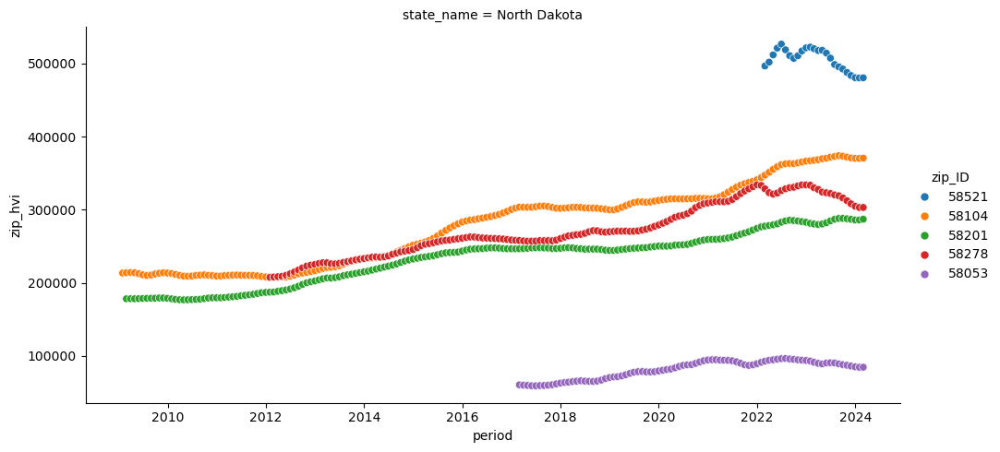

In [15]:
ax0 = sns.relplot(data=explore_zillow[explore_zillow['state_name'] == 'Minnesota'], kind='scatter', \
            x='period', y='zip_hvi', hue='zip_ID', row='state_name', height=5, aspect=2)
ax1 = sns.relplot(data=explore_zillow[explore_zillow['state_name'] == 'North Dakota'], kind='scatter', \
            x='period', y='zip_hvi', hue='zip_ID', row='state_name', height=5, aspect=2)

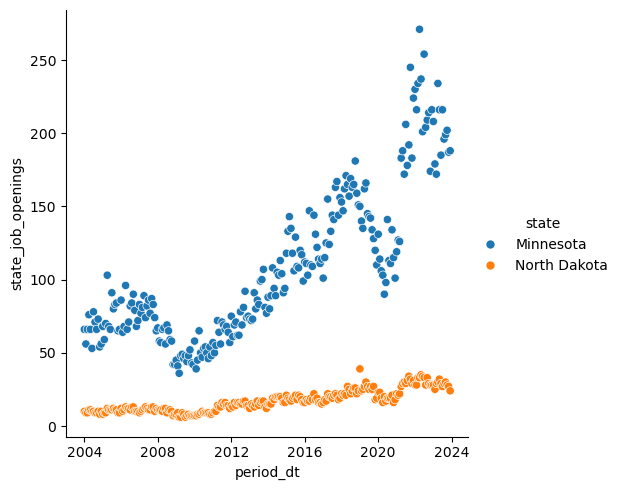

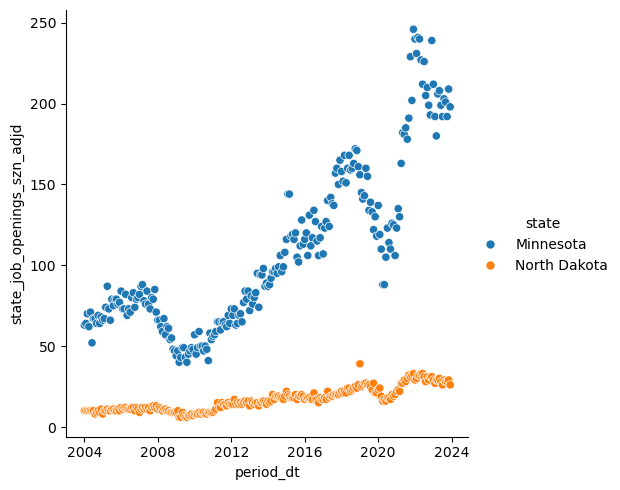

In [16]:
ax2 = sns.relplot(data=jolts[jolts['state'].isin(['Minnesota','North Dakota'])], kind='scatter', \
            x='period_dt', y='state_job_openings', hue='state')
ax3 = sns.relplot(data=jolts[jolts['state'].isin(['Minnesota','North Dakota'])], kind='scatter', \
            x='period_dt', y='state_job_openings_szn_adjd', hue='state')
plt.show()

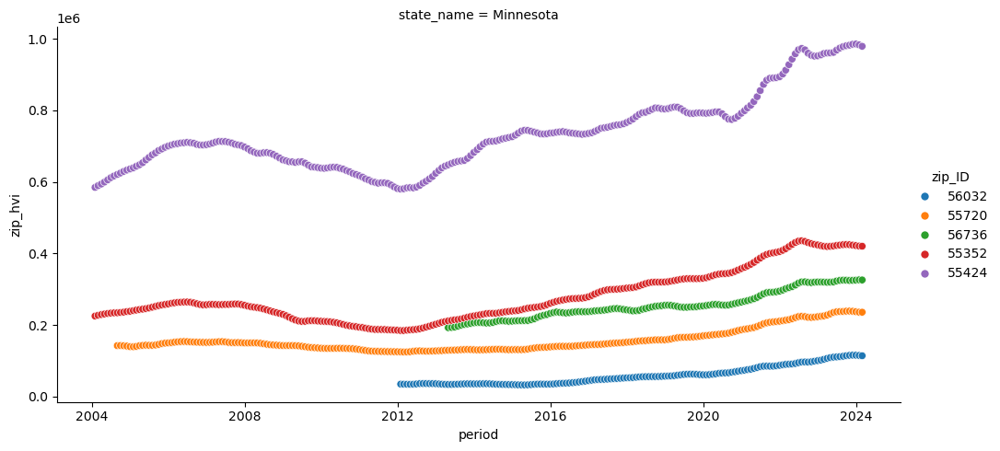

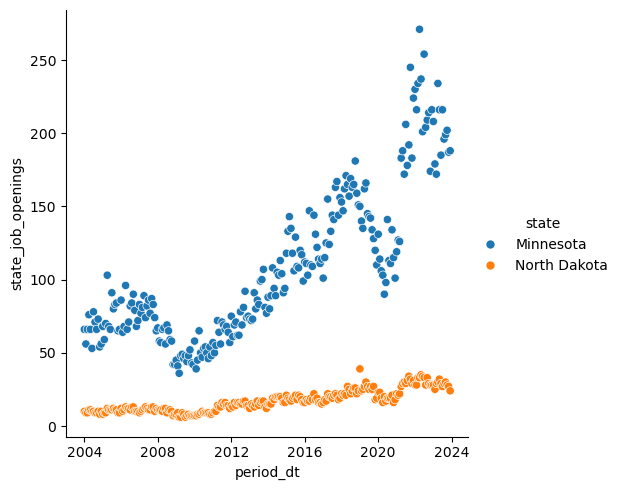

In [17]:
ax = sns.relplot(data=explore_zillow[explore_zillow['state_name'] == 'Minnesota'], kind='scatter', \
            x='period', y='zip_hvi', hue='zip_ID', row='state_name', height=5, aspect=2)

ax = sns.relplot(data=jolts[jolts['state'].isin(['Minnesota','North Dakota'])], kind='scatter', \
            x='period_dt', y='state_job_openings', hue='state')

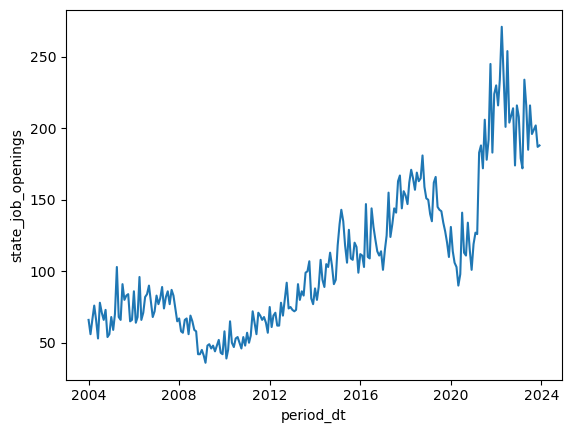

In [18]:
ax = sns.lineplot(data=jolts[jolts['state'] == 'Minnesota'], \
            x='period_dt', y='state_job_openings')

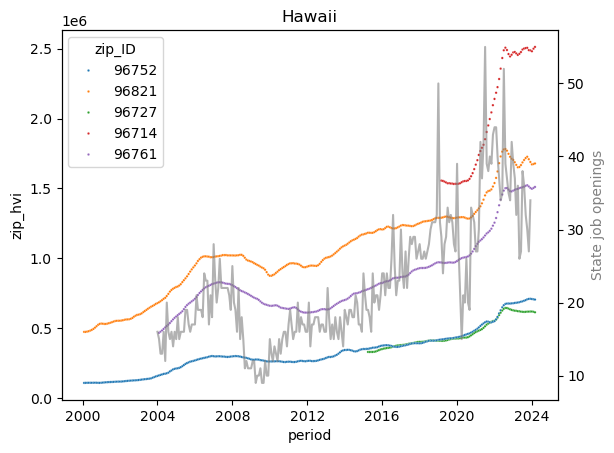

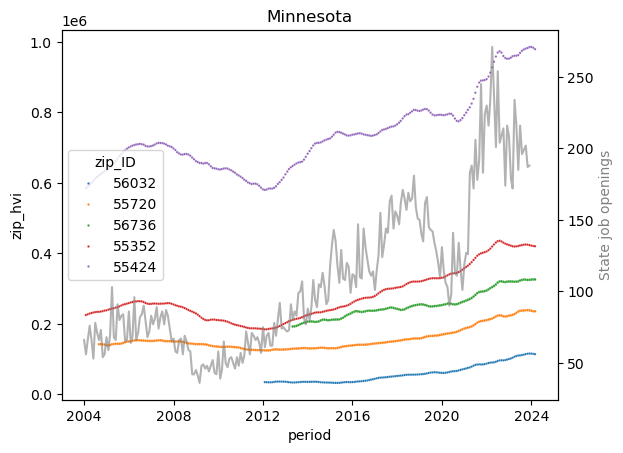

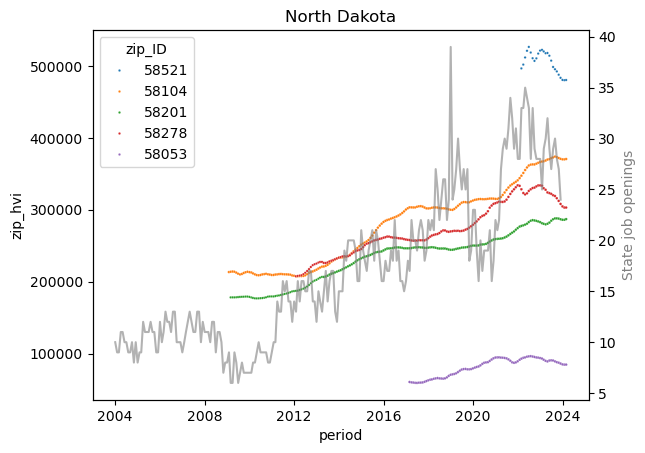

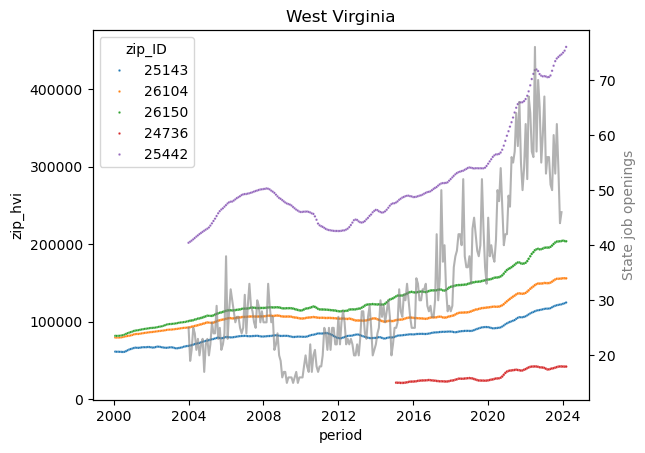

In [19]:
#How do job openings appear to impact hvi?
import warnings
with warnings.catch_warnings():
    warnings.simplefilter('ignore')

    for state in explore_states['state_name']:
        sns.scatterplot(data=explore_zillow[explore_zillow['state_name'] == state], \
                    x='period', y='zip_hvi', hue='zip_ID', s=3)
        ax2 = plt.twinx()
        sns.lineplot(data=jolts[jolts['state'] == state], x='period_dt', y='state_job_openings', color='gray', alpha=.6).set(title=state)
        ax2.set_ylabel('State job openings',color='gray')
        
        plt.show()

**Job openings seem to have a higher correlation with the highest priced zip codes in each state**

In [20]:
z = pd.DataFrame(zillow.groupby(['year','month','period','state_name'])['state_hvi'].mean().reset_index())
z

,year,month,period,state_name,state_hvi
0,2000,1,2000-01-31,Alabama,96628.198952
1,2000,1,2000-01-31,Alaska,132714.910837
2,2000,1,2000-01-31,Arizona,137268.507535
3,2000,1,2000-01-31,Arkansas,84910.409215
4,2000,1,2000-01-31,California,194240.160016
...,...,...,...,...,...
14348,2024,2,2024-02-29,Virginia,383326.712851
14349,2024,2,2024-02-29,Washington,589807.142218
14350,2024,2,2024-02-29,West Virginia,155333.089031
14351,2024,2,2024-02-29,Wisconsin,289235.878479


In [21]:
j = jolts.groupby(['year','month','state'])[['state_job_openings','state_job_openings_szn_adjd']].mean().reset_index()
j

,year,month,state,state_job_openings,state_job_openings_szn_adjd
0,2004,1,Alabama,64.0,58.0
1,2004,1,Alaska,11.0,13.0
2,2004,1,Arizona,76.0,66.0
3,2004,1,Arkansas,33.0,33.0
4,2004,1,California,388.0,371.0
...,...,...,...,...,...
11995,2023,12,Virginia,268.0,263.0
11996,2023,12,Washington,150.0,165.0
11997,2023,12,West Virginia,46.0,50.0
11998,2023,12,Wisconsin,153.0,178.0


In [22]:
merged = pd.merge(z, j, \
                  how = 'inner',
                  left_on=['year','month','state_name'], \
                  right_on=['year','month','state'])

merged.dtypes

year                                    int32
month                                   int32
period                         datetime64[ns]
state_name                             object
state_hvi                             float64
state                                  object
state_job_openings                    float64
state_job_openings_szn_adjd           float64
dtype: object

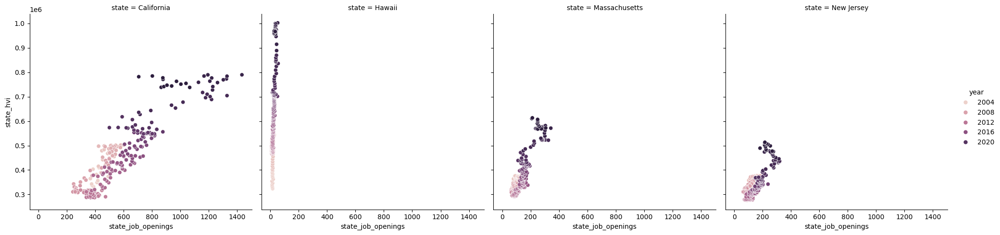

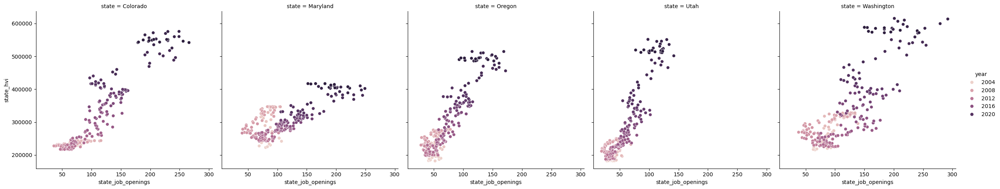

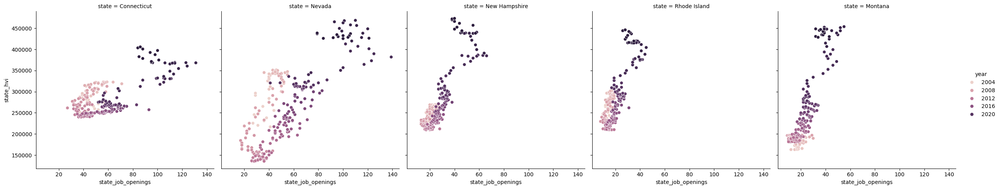

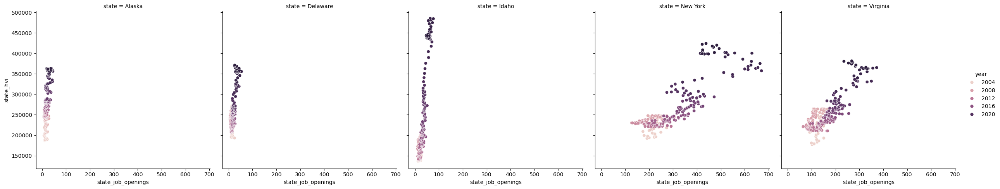

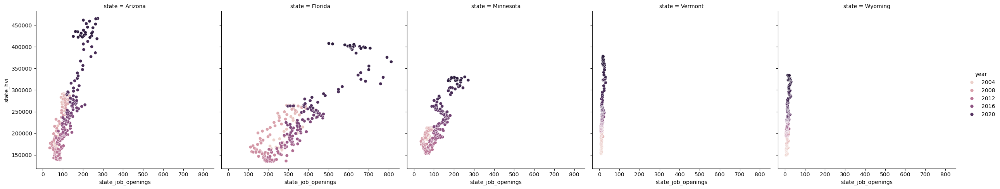

...

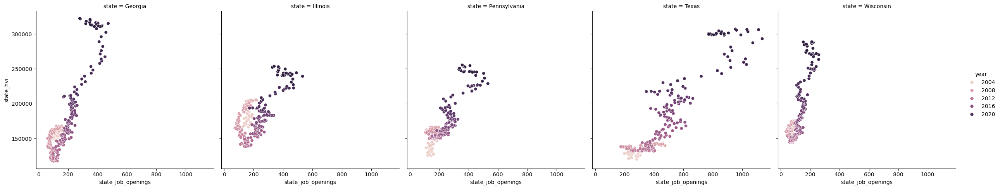

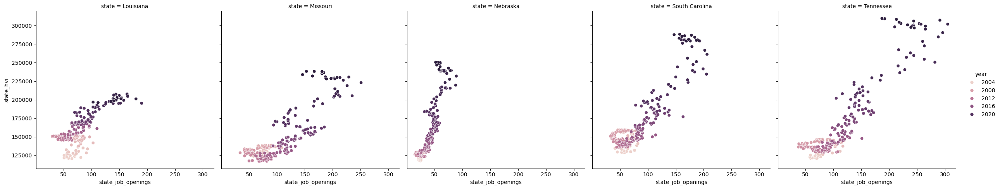

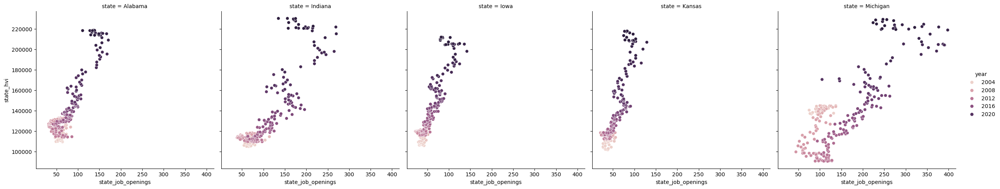

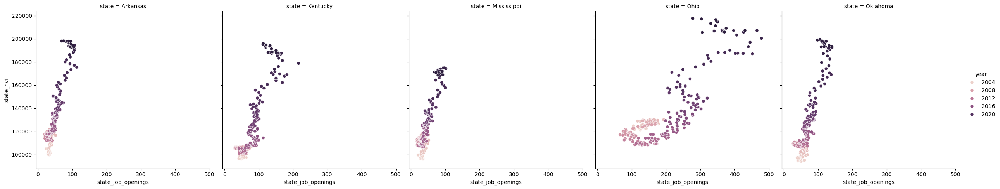

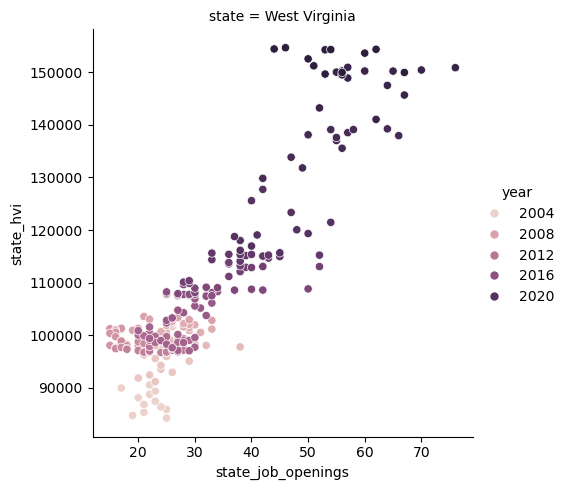

In [23]:
#Is job opening corrolated with hvi for each state?
for i in range(0, len(state_rank), 5):
        chunk = state_rank[i:i+5]
        sns.relplot(data=merged[merged['state_name'].isin(chunk['state_name'])], kind='scatter', \
                            x='state_job_openings', y='state_hvi', col='state', hue='year')

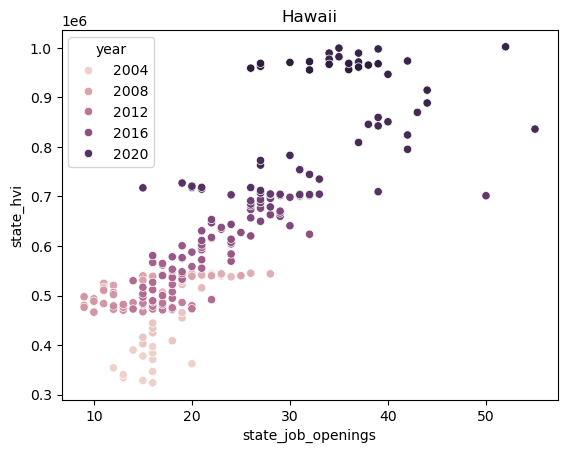

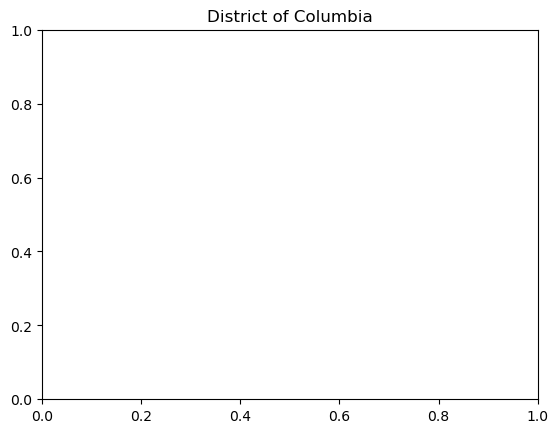

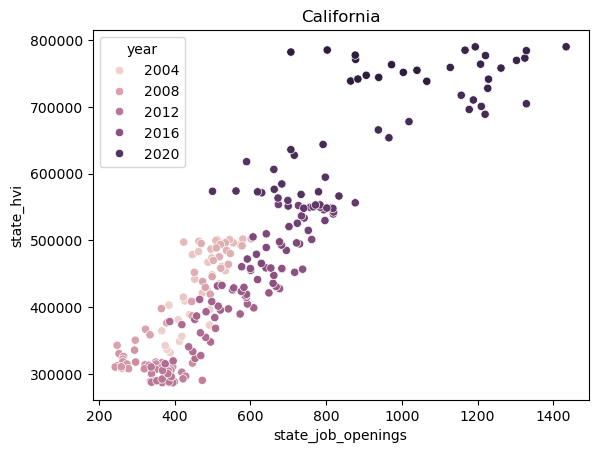

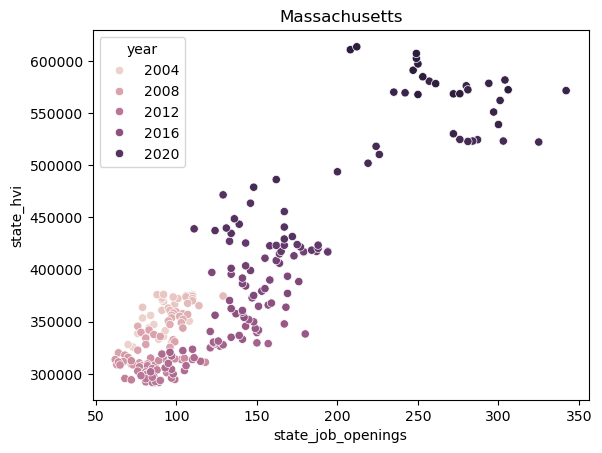

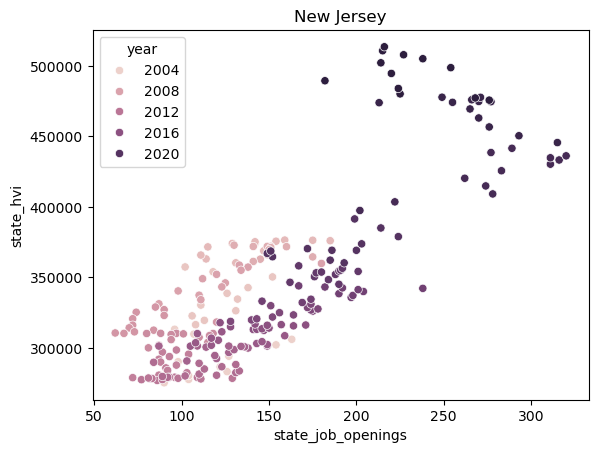

...

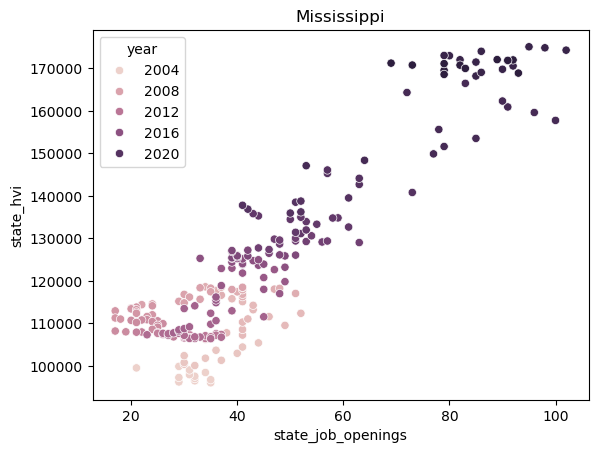

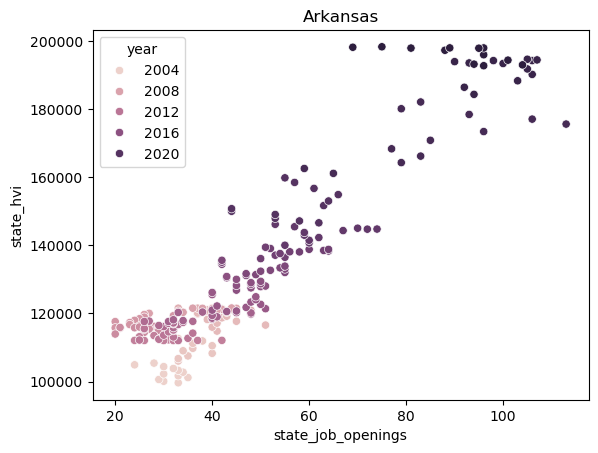

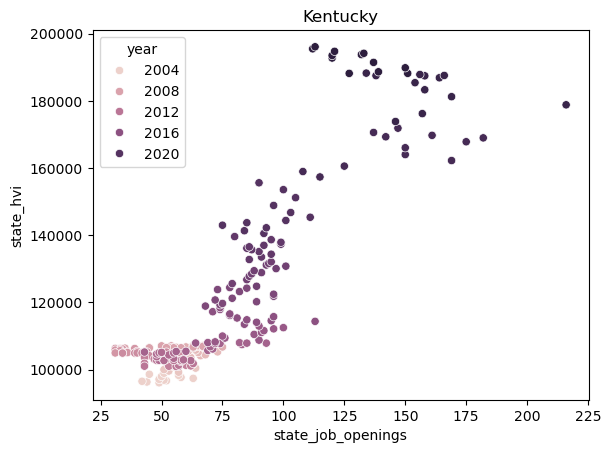

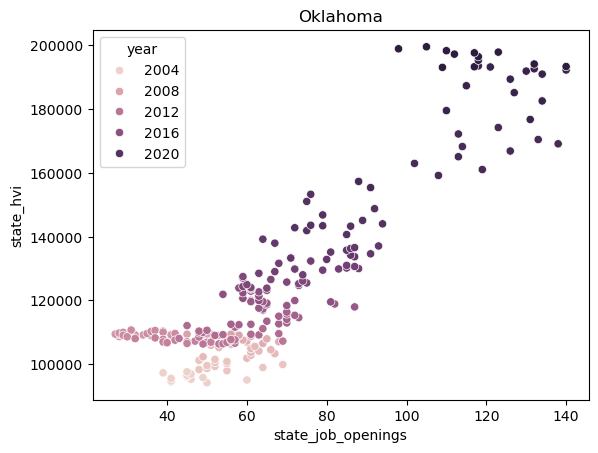

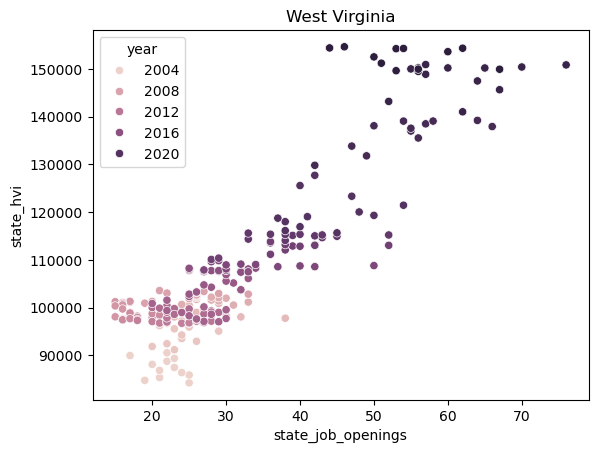

In [24]:
for i, state in enumerate(state_rank['state_name']):
    
    i = sns.scatterplot(data=merged[merged['state_name']==state], \
                    x='state_job_openings', y='state_hvi', hue='year').set(title=state)

    plt.show()

**Strength of corrolation varies by state, but all states have a positive corrolation between job openings and hpi.**

In [25]:
zillow_merged = pd.merge(zillow, j, \
                  how = 'left',
                  left_on=['year','month','state_name'], \
                  right_on=['year','month','state'])

zillow_merged

,zip_ID,zip_type,state_ID,state_name,state_type,metro_ID,metro_name,metro_type,period,zip_hvi,...,metro_med_days_to_close,metro_pct_abv_list,metro_pct_blw_list,metro_pct_w_pricecut,fuzzy_score,year,month,state,state_job_openings,state_job_openings_szn_adjd
0,99501,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,1.435977e+05,...,NaN,NaN,NaN,NaN,NaN,2000,1,NaN,NaN,NaN
1,99502,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,1.461615e+05,...,NaN,NaN,NaN,NaN,NaN,2000,1,NaN,NaN,NaN
2,99503,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,1.166383e+05,...,NaN,NaN,NaN,NaN,NaN,2000,1,NaN,NaN,NaN
3,99504,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,1.277984e+05,...,NaN,NaN,NaN,NaN,NaN,2000,1,NaN,NaN,NaN
4,99507,zip,AK,Alaska,state,394327,"Anchorage, AK",msa,2000-01-31,1.483951e+05,...,NaN,NaN,NaN,NaN,NaN,2000,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4840895,26865,zip,WV,West Virginia,state,NaN,"Winchester, VA",NaN,2024-02-29,2.901040e+05,...,NaN,NaN,NaN,NaN,95.0,2024,2,NaN,NaN,NaN
4840896,83001,zip,WY,Wyoming,state,NaN,"Jackson, WY",NaN,2024-02-29,2.348668e+06,...,NaN,NaN,NaN,NaN,95.0,2024,2,NaN,NaN,NaN
4840897,83013,zip,WY,Wyoming,state,NaN,"Jackson, WY",NaN,2024-02-29,1.550382e+06,...,NaN,NaN,NaN,NaN,95.0,2024,2,NaN,NaN,NaN
4840898,83014,zip,WY,Wyoming,state,NaN,"Jackson, WY",NaN,2024-02-29,4.363572e+06,...,NaN,NaN,NaN,NaN,95.0,2024,2,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation heatmap')

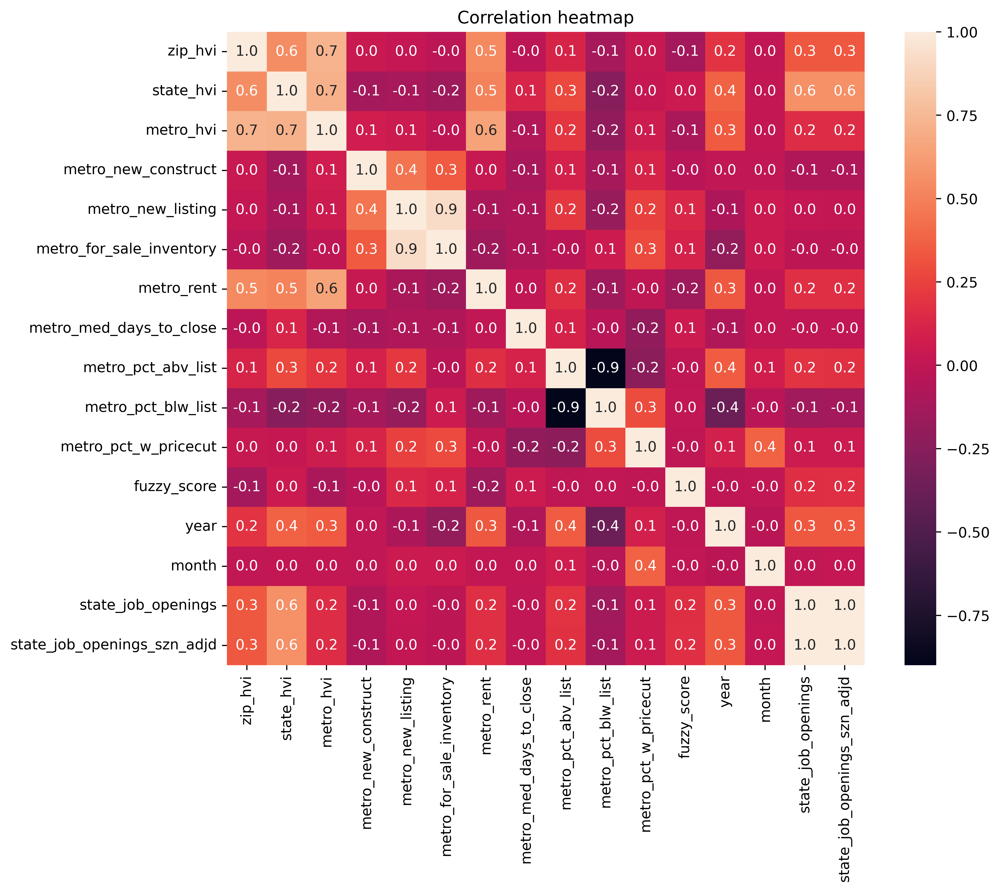

In [26]:
plt.figure(figsize=(10,8), dpi =500)
metrics = ['zip_hvi','state_hvi']
z_corr = zillow_merged.select_dtypes(include=['float64','int32']).corr()
heat = sns.heatmap(z_corr,annot=True,fmt=".1f")
heat.set_title('Correlation heatmap')

**Job openings and rent appear to be strongest corrolations with hvi at the national level**

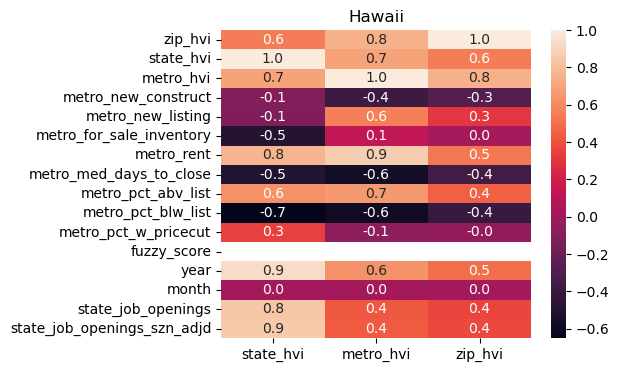

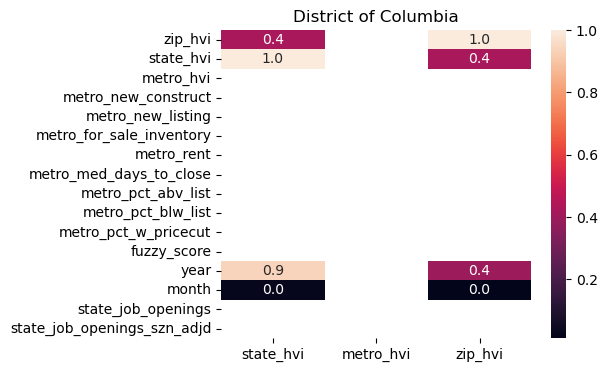

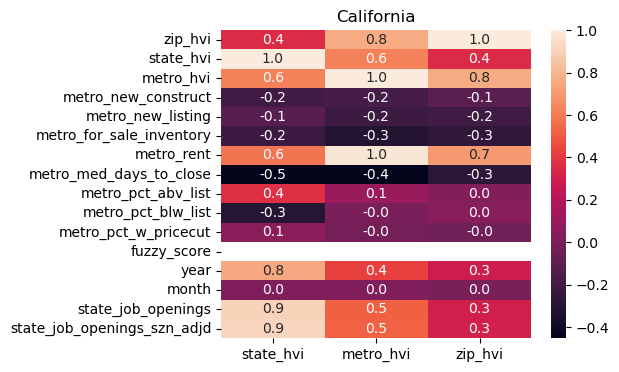

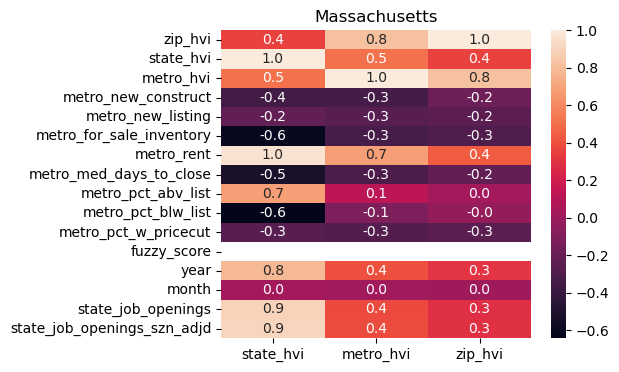

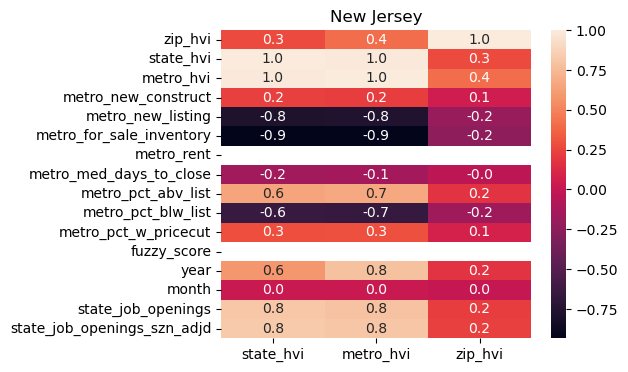

...

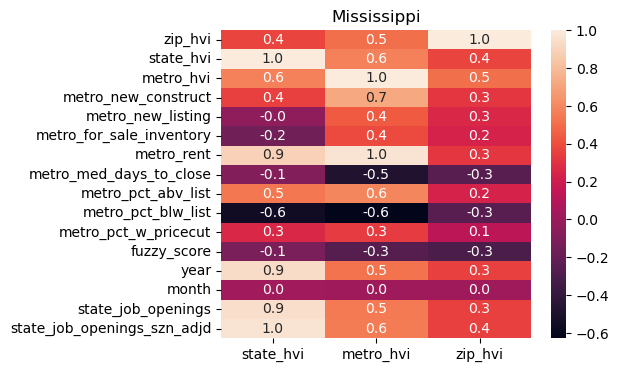

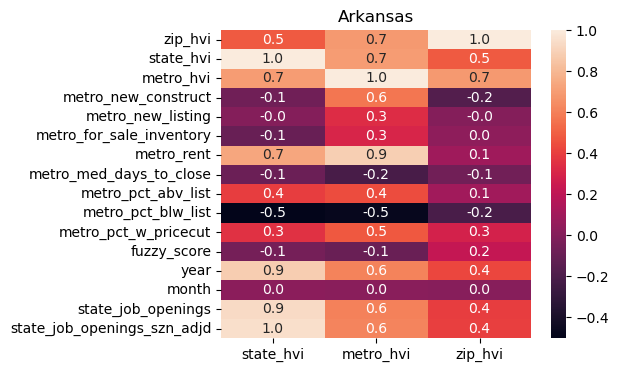

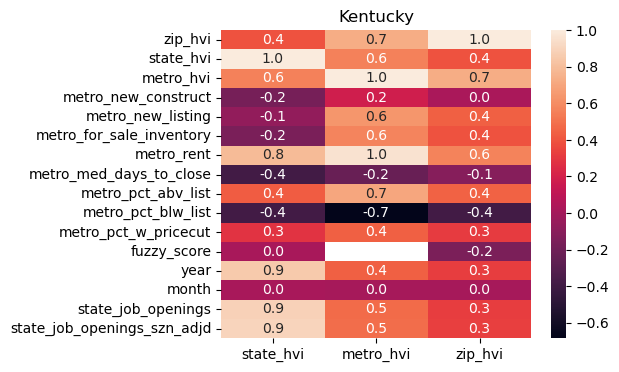

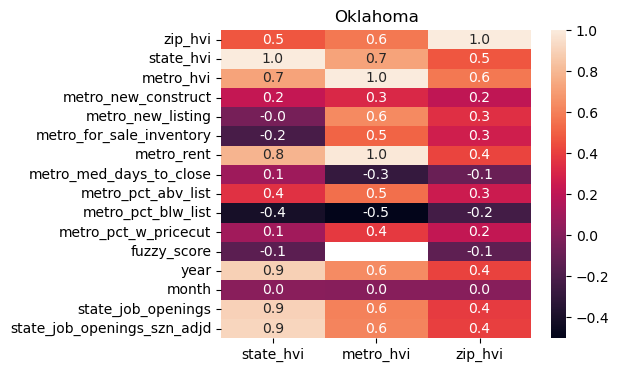

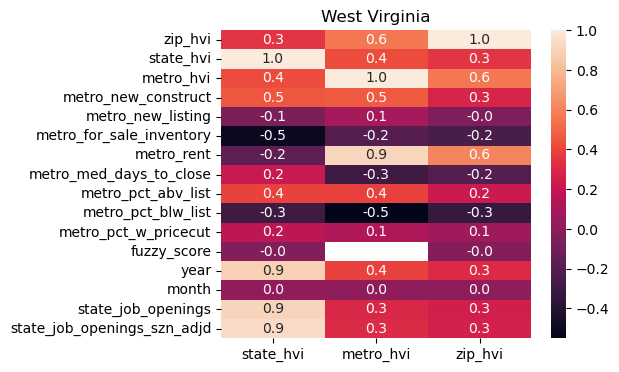

In [27]:
for i, state in enumerate(state_rank['state_name']):

    zillow_merged_state = zillow_merged[zillow_merged['state_name']==state]
    
    plt.figure(figsize=(5,4))
    z_corr = zillow_merged_state.select_dtypes(include=['float64','int32']).corr()
    i = sns.heatmap(z_corr[['state_hvi','metro_hvi','zip_hvi']],annot=True,fmt=".1f")
    i.set_title(state)

    plt.show()

In [99]:
state_corr = pd.DataFrame()

for state in state_rank['state_name']:

    zillow_merged_state = zillow_merged[zillow_merged['state_name']==state]
    z_corr = zillow_merged_state.select_dtypes(include=['float64','int32']).corr()
    z_corr['State'] = state
    state_corr = pd.concat([state_corr,z_corr.iloc[:3]])

state_corr

,zip_hvi,state_hvi,metro_hvi,metro_new_construct,metro_new_listing,metro_for_sale_inventory,metro_rent,metro_med_days_to_close,metro_pct_abv_list,metro_pct_blw_list,metro_pct_w_pricecut,fuzzy_score,year,month,state_job_openings,state_job_openings_szn_adjd,State
zip_hvi,1.000000,0.553691,0.753689,-0.288728,0.307113,0.030615,0.530862,-0.356287,0.446669,-0.400132,-0.046826,NaN,0.498044,0.016477,0.360018,0.367922,Hawaii
state_hvi,0.553691,1.000000,0.691431,-0.098558,-0.116965,-0.496024,0.763832,-0.501496,0.622202,-0.651211,0.344828,NaN,0.935458,0.021438,0.833936,0.852616,Hawaii
metro_hvi,0.753689,0.691431,1.000000,-0.381255,0.556149,0.131748,0.869559,-0.571406,0.657824,-0.584905,-0.061671,NaN,0.631452,0.020317,0.422878,0.432258,Hawaii
zip_hvi,1.000000,0.421240,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.396416,0.011107,NaN,NaN,District of Columbia
state_hvi,0.421240,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.941312,0.025800,NaN,NaN,District of Columbia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
state_hvi,0.466990,1.000000,0.721754,0.220495,-0.045237,-0.216738,0.785807,0.089462,0.352633,-0.411627,0.098456,-0.145327,0.889818,0.019276,0.895609,0.912898,Oklahoma
metro_hvi,0.576852,0.721754,1.000000,0.318410,0.630992,0.510170,0.984552,-0.289386,0.544423,-0.501545,0.383497,NaN,0.637969,0.013676,0.606471,0.618244,Oklahoma
zip_hvi,1.000000,0.343082,0.562066,0.285560,-0.049977,-0.249652,0.606341,-0.199977,0.225138,-0.328436,0.066714,-0.030066,0.299535,0.010071,0.253546,0.262573,West Virginia
state_hvi,0.343082,1.000000,0.419471,0.454279,-0.063845,-0.508950,-0.166512,0.214820,0.389919,-0.292205,0.173864,-0.038948,0.885477,0.014418,0.903768,0.934099,West Virginia


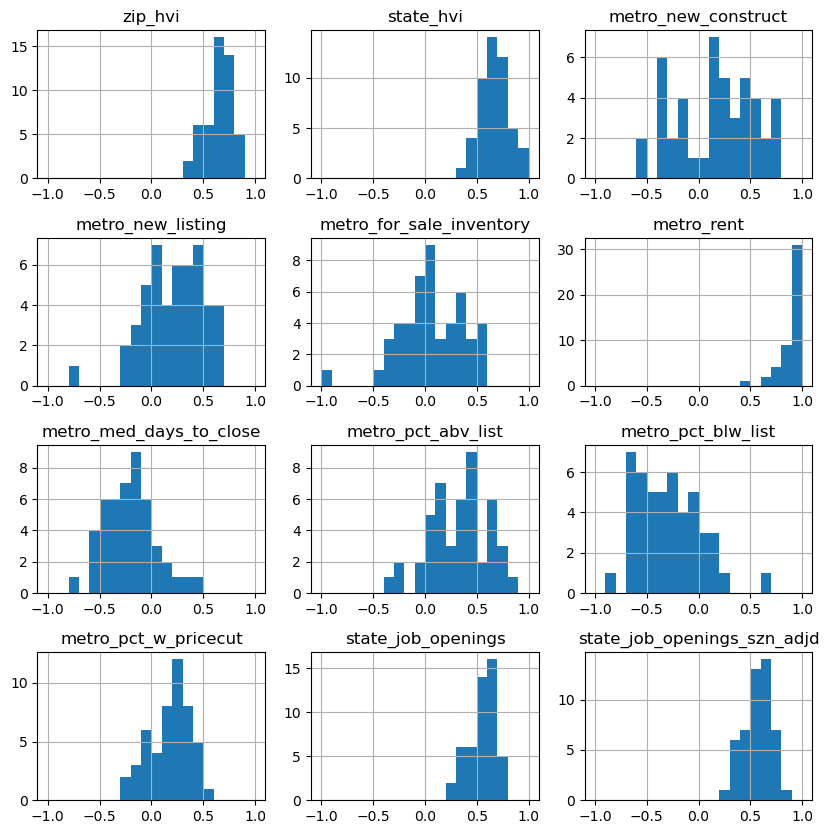

In [132]:
state_corr_metro = state_corr.loc['metro_hvi']
state_corr_metro = state_corr_metro.drop(columns=['metro_hvi','year','month','fuzzy_score'])
state_corr_metro.hist(bins=list(np.arange(-1,1.1,.1)), figsize=(10,10))
plt.subplots_adjust(hspace=.4)
plt.subplots_adjust(wspace=.2)

In [149]:
state_corr_metro_merged = state_corr_metro.merge(state_rank, left_on=['State'], right_on=['state_name'], how='left')
state_corr_metro_merged = state_corr_metro_merged.rename(columns={'state_hvi_x':'state_hvi','state_hvi_y':'state_hvi_mean'})
state_corr_metro_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   zip_hvi                      49 non-null     float64
 1   state_hvi                    49 non-null     float64
 2   metro_new_construct          46 non-null     float64
 3   metro_new_listing            49 non-null     float64
 4   metro_for_sale_inventory     49 non-null     float64
 5   metro_rent                   47 non-null     float64
 6   metro_med_days_to_close      47 non-null     float64
 7   metro_pct_abv_list           47 non-null     float64
 8   metro_pct_blw_list           47 non-null     float64
 9   metro_pct_w_pricecut         49 non-null     float64
 10  state_job_openings           49 non-null     float64
 11  state_job_openings_szn_adjd  49 non-null     float64
 12  State                        51 non-null     object 
 13  state_name            

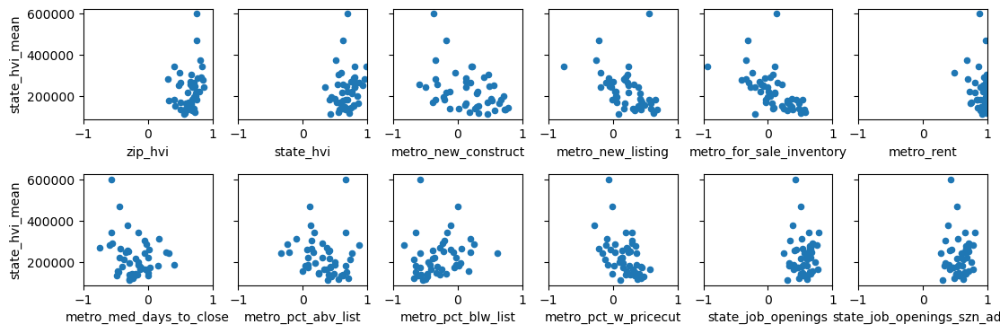

In [190]:
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(13,4), sharey=True)

for xcol, ax in zip(state_corr_metro.columns, axes.flat):
    state_corr_metro_merged.plot(kind='scatter', ax=ax, x=xcol, y='state_hvi_mean')
    ax.set(xlim=(-1,1))

plt.subplots_adjust(hspace=.5)
plt.subplots_adjust(wspace=.2)

**Pct above listing appear to be strong corrolation in many states. For sale inventory and new listings offer strong negative corrolations.**

In [28]:
metros = zillow.groupby(['metro_ID','metro_name'])['metro_hvi'].mean().sort_values(ascending=False)
metros = metros.dropna()
metros = metros.reset_index()
metros

,metro_ID,metro_name,metro_hvi
0,394713,"Jackson, WY",872448.849092
1,753871,"Breckenridge, CO",801902.901378
2,753925,"Vineyard Haven, MA",755587.163042
3,394744,"Key West, FL",739196.521744
4,394556,"Edwards, CO",683281.920997
...,...,...,...
741,394516,"Danville, IL",59108.882028
742,394601,"Forrest City, AR",58958.406466
743,394676,"Helena, AR",51106.585931
744,394470,"Clarksdale, MS",49737.670812


In [29]:
metro_count = len(metros)
metro_review = list(range(0,5))+list(range(metro_count//2-5,metro_count//2))+list(range(metro_count-5,metro_count))
metros_review_df = metros.iloc[metro_review]
metros_review_df

,metro_ID,metro_name,metro_hvi
0,394713,"Jackson, WY",872448.849092
1,753871,"Breckenridge, CO",801902.901378
2,753925,"Vineyard Haven, MA",755587.163042
3,394744,"Key West, FL",739196.521744
4,394556,"Edwards, CO",683281.920997
368,753865,"Bardstown, KY",141668.558984
369,394919,"Norfolk, NE",141611.758031
370,394432,"Calhoun, GA",140996.114061
371,394523,"Decatur, AL",140857.311312
372,394920,"North Platte, NE",140814.680371


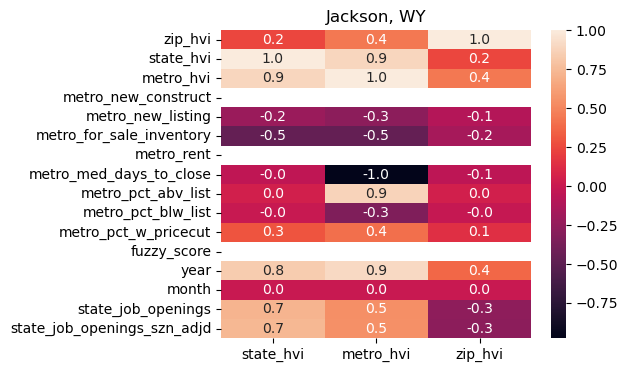

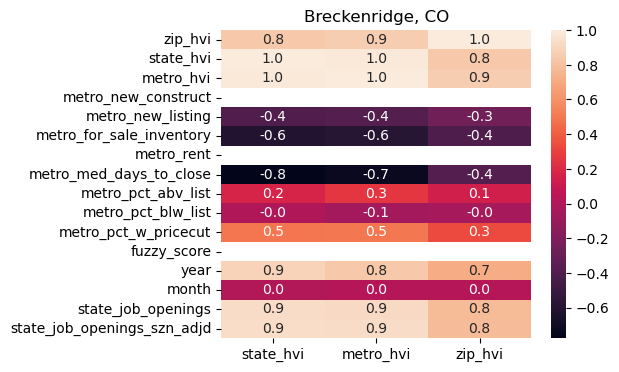

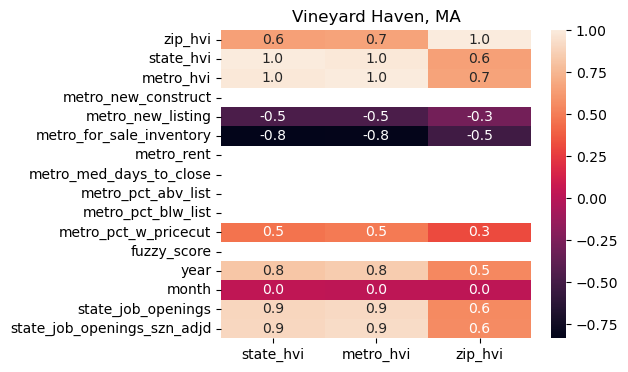

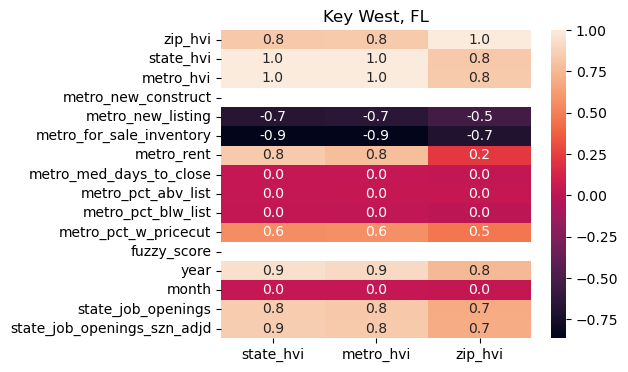

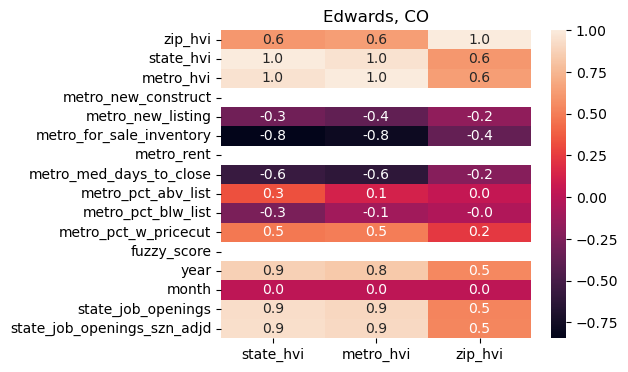

...

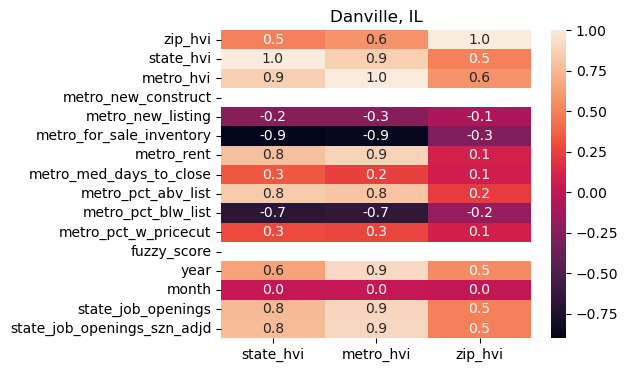

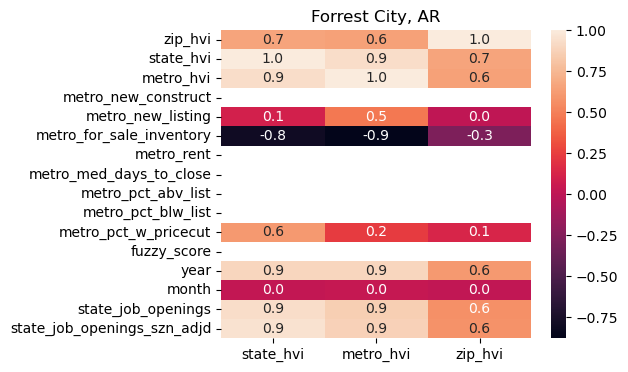

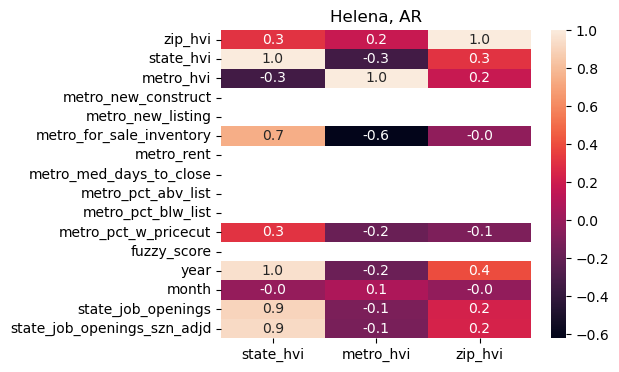

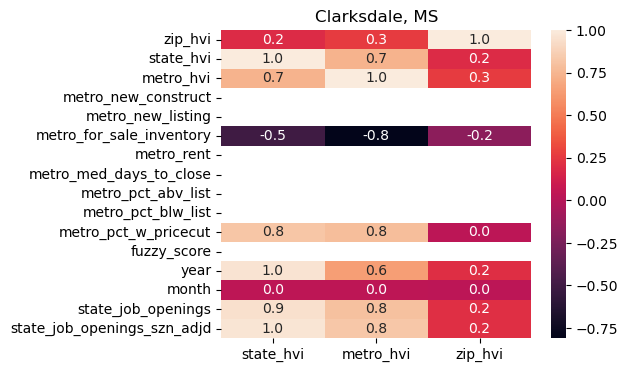

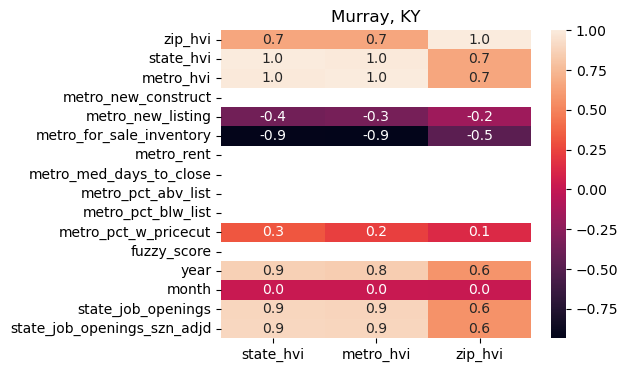

In [30]:
for i, metro in enumerate(metros_review_df['metro_name']):

    zillow_merged_state = zillow_merged[zillow_merged['metro_name']==metro]
    
    plt.figure(figsize=(5,4))
    z_corr = zillow_merged_state.select_dtypes(include=['float64','int32']).corr()
    i = sns.heatmap(z_corr[['state_hvi','metro_hvi','zip_hvi']],annot=True,fmt=".1f")
    i.set_title(metro)

    plt.show()

**Rent, job openings, pct above listing, for sale inventory and new listings continue to provide strongest corrolations. State hvi as a strong correlation with metro.**

**Days to close data in less available in lower value metros. Some markets show very strong negative corrolation. A few markets (Bardstown, KY & Danville, IL) showed strong positive corrolation. Key West, FL showed no corrolation. Further investigation may be needed.**

*****
Analyze rent corrolation to metro hvi
*****

In [31]:
cols = ['metro_id','corr','mean_hvi','state_name','rent_data_periods']
rent_corr = pd.DataFrame(columns=cols)
na_list = []

for metro in metros['metro_ID']:
    df = zillow_merged[zillow_merged['metro_ID']==metro]
    df = df.dropna(subset='metro_rent')
    corr_df = df[['metro_rent','metro_hvi']].corr()
    corr = corr_df.iloc[1,0]
    if np.isnan(corr):
        na_list.append(metro)
    else:
        mean = df['metro_hvi'].mean()
        state = df['state_name'].unique()
        rdp = df['period'].nunique()
        df_entry = pd.DataFrame([[metro, corr, mean, state, rdp]], columns=cols)
        rent_corr = pd.concat([rent_corr, df_entry], ignore_index=True)

print(rent_corr)
print(len(na_list))

C:\Users\Brendan\AppData\Local\Temp\ipykernel_17736\1336825775.py:17: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rent_corr = pd.concat([rent_corr, df_entry], ignore_index=True)


    metro_id      corr      mean_hvi                 state_name  \
0     394744  0.778864  1.021965e+06                  [Florida]   
1     753924  0.975730  8.548701e+05                   [Hawaii]   
2     394674  0.039384  1.111241e+06                     [Utah]   
3     394900  0.976463  7.861652e+05               [California]   
4     395050  0.978536  6.233992e+05               [California]   
..       ...       ...           ...                        ...   
289   394396 -1.000000  1.279124e+05  [Virginia, West Virginia]   
290   394893  0.992075  1.088675e+05                  [Indiana]   
291   394897  0.822676  1.341163e+05                 [Oklahoma]   
292   394524  0.871455  9.756493e+04                 [Illinois]   
293   394516  0.876199  7.911354e+04                 [Illinois]   

    rent_data_periods  
0                  26  
1                 110  
2                  14  
3                  84  
4                 110  
..                ...  
289                 2  
290

Text(0.5, 1.0, 'Metro area histogram: Metro rent to metro_hvi corrolation')

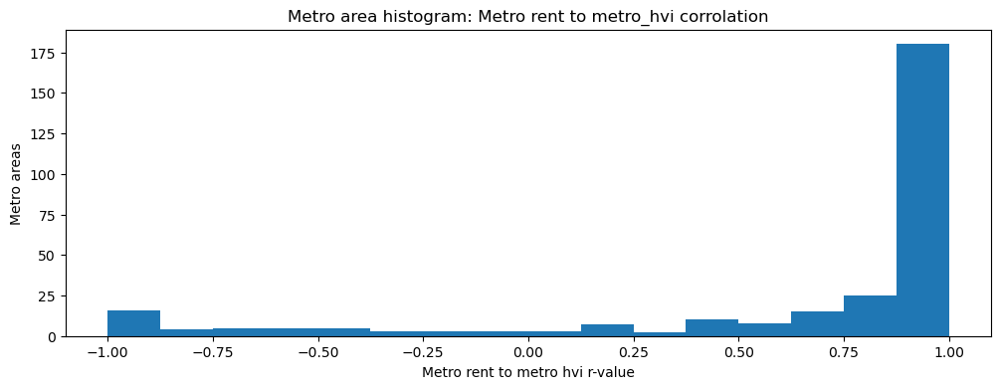

In [32]:
plt.figure(figsize=(12,4))
plt.hist(rent_corr['corr'], bins=16)
plt.xlabel('Metro rent to metro hvi r-value')
plt.ylabel('Metro areas')
plt.title('Metro area histogram: Metro rent to metro_hvi corrolation')

Text(0.5, 1.0, 'Metro area corrolation plotted against mean metro home values')

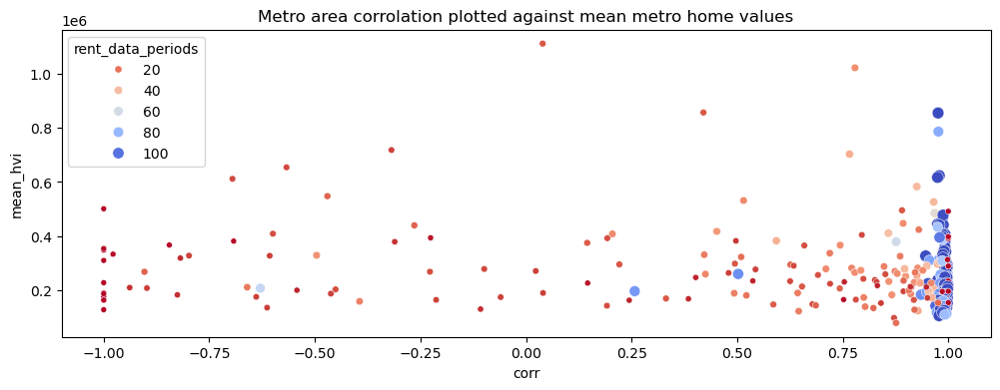

In [33]:
plt.figure(figsize=(12,4))
sns.scatterplot(data=rent_corr, x='corr', y='mean_hvi',
                size='rent_data_periods', hue='rent_data_periods', palette=sns.color_palette("coolwarm_r", as_cmap=True))
plt.title('Metro area corrolation plotted against mean metro home values')

**Rent is strongly correlated to metro_hvi when at least 5 years of rent data is available. Only a few outlier metro areas exist in lower value metro areas.**

In [34]:
negative_corr = rent_corr[rent_corr['corr'] < 0]
negative_corr = negative_corr.sort_values(by=['corr','rent_data_periods'])
print(negative_corr.head())
negative_corr[negative_corr.rent_data_periods == negative_corr.rent_data_periods.max()]

    metro_id  corr       mean_hvi                 state_name rent_data_periods
261   395144  -1.0  186985.225905                 [Oklahoma]                 2
289   394396  -1.0  127912.403047  [Virginia, West Virginia]                 2
23    394567  -1.0  500862.331062               [Washington]                 2
91    394983  -1.0  348190.516427            [Massachusetts]                 2
241   395120  -1.0  174873.062716         [Kansas, Missouri]                 2


,metro_id,corr,mean_hvi,state_name,rent_data_periods
169,394930,-0.629161,207420.868538,[Texas],65


In [35]:
temp = zillow_merged[zillow_merged['metro_ID'] == '394930']
temp = temp[['zip_ID','metro_name','zip_hvi','metro_hvi','metro_rent','period']]
temp.T

,480785,480786,480787,480788,480789,486530,486531,486532,486533,486534,...,1880087,1880088,1880089,1889266,1889267,1889268,1889269,1889270,1889271,1889272
zip_ID,79761,79762,79763,79764,79766,79758,79761,79762,79763,79764,...,79764,79765,79766,79758,79761,79762,79763,79764,79765,79766
metro_name,"Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX",...,"Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX","Odessa, TX"
zip_hvi,77083.527159,104562.287314,77903.455313,89507.624792,116640.771006,180872.238096,76988.010467,104422.877657,77981.827647,89550.045188,...,192137.692943,304034.561593,257855.366162,348012.025052,171450.00274,226544.417015,174702.781297,195275.933114,305100.075562,261343.162385
metro_hvi,99011.181686,99011.181686,99011.181686,99011.181686,99011.181686,98955.094057,98955.094057,98955.094057,98955.094057,98955.094057,...,215571.908048,215571.908048,215571.908048,218126.030434,218126.030434,218126.030434,218126.030434,218126.030434,218126.030434,218126.030434
metro_rent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2070.996998,2070.996998,2070.996998,2066.865079,2066.865079,2066.865079,2066.865079,2066.865079,2066.865079,2066.865079
period,2009-01-31 00:00:00,2009-01-31 00:00:00,2009-01-31 00:00:00,2009-01-31 00:00:00,2009-01-31 00:00:00,2009-02-28 00:00:00,2009-02-28 00:00:00,2009-02-28 00:00:00,2009-02-28 00:00:00,2009-02-28 00:00:00,...,2024-01-31 00:00:00,2024-01-31 00:00:00,2024-01-31 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00,2024-02-29 00:00:00


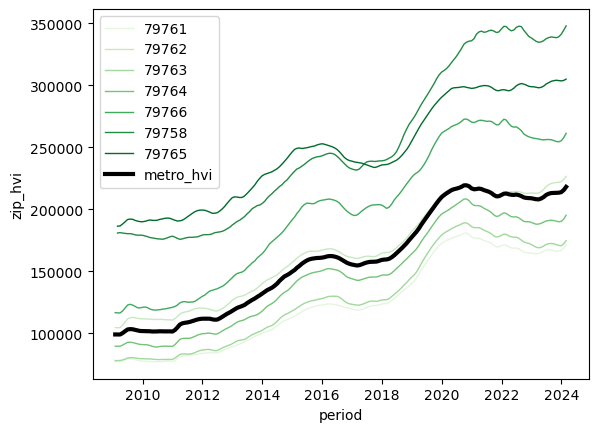

In [36]:
p1 = sns.lineplot(data=temp, x='period', y='zip_hvi', hue='zip_ID', linewidth=1, palette=sns.color_palette("Greens", n_colors=temp['zip_ID'].nunique()))
p1 = sns.lineplot(data=temp, x='period', y='metro_hvi', color='black', linewidth=3, label='metro_hvi')
plt.show()

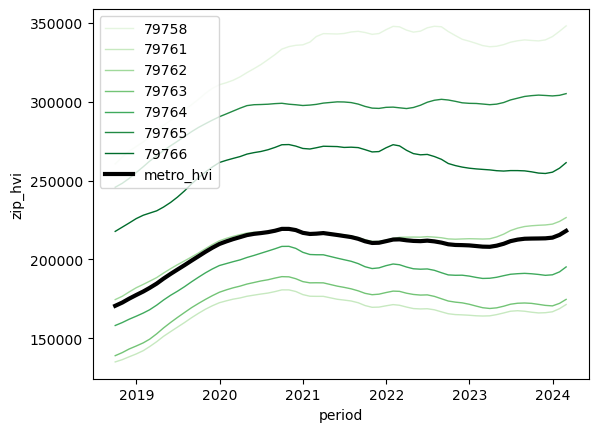

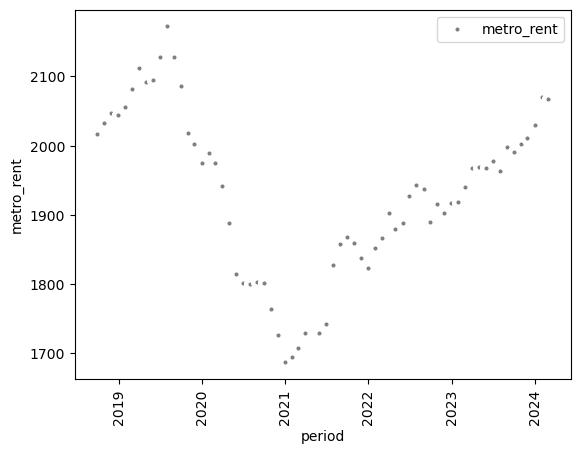

In [37]:
temp = temp.dropna(subset='metro_rent')

p1 = sns.lineplot(data=temp, x='period', y='zip_hvi', hue='zip_ID', linewidth=1, palette=sns.color_palette("Greens", n_colors=temp['zip_ID'].nunique()))
p1 = sns.lineplot(data=temp, x='period', y='metro_hvi', color='black', linewidth=3, label='metro_hvi')
plt.show()
plt.clf()
p2 = sns.scatterplot(data=temp, x='period', y='metro_rent', color='gray', linewidth=3, label='metro_rent')
p2.tick_params(axis='x', rotation=90)

**Odessa, TX seems like an outlier where rent declined during covid, but house prices rose during the same period. Eventually house prices fell slightly at the time where rent bottomed out.**

*****
Analyze job opening corrolation to metro hvi
*****

In [39]:
cols = ['metro_id','corr','mean_hvi','state_name','data_periods']
job_corr = pd.DataFrame(columns=cols)
na_list = []

for metro in metros['metro_ID']:
    df = zillow_merged[zillow_merged['metro_ID']==metro]
    df = df.dropna(subset='state_job_openings')
    corr_df = df[['state_job_openings','metro_hvi']].corr()
    corr = corr_df.iloc[1,0]
    if np.isnan(corr):
        na_list.append(metro)
    else:
        mean = df['metro_hvi'].mean()
        state = df['state_name'].unique()
        dp = df['period'].nunique()
        df_entry = pd.DataFrame([[metro, corr, mean, state, dp]], columns=cols)
        job_corr = pd.concat([job_corr, df_entry], ignore_index=True)

print(job_corr)
print(len(na_list))

C:\Users\Brendan\AppData\Local\Temp\ipykernel_17736\3738325358.py:17: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  job_corr = pd.concat([job_corr, df_entry], ignore_index=True)


    metro_id      corr       mean_hvi        state_name data_periods
0     394713  0.538265  862477.133209  [Wyoming, Idaho]          176
1     753871  0.911864  804182.808120        [Colorado]          236
2     753925  0.913081  805103.410001   [Massachusetts]          240
3     394744  0.826349  731839.184540         [Florida]           95
4     394556  0.900655  731849.886391        [Colorado]          237
..       ...       ...            ...               ...          ...
741   394516  0.892930   61003.096744        [Illinois]          240
742   394601  0.856497   60994.183095        [Arkansas]          240
743   394676 -0.109232   51504.985268        [Arkansas]          129
744   394470  0.797751   49874.966317     [Mississippi]           95
745   394894  0.881934   45065.784836        [Kentucky]          240

[746 rows x 5 columns]
0


Text(0.5, 1.0, 'Metro area histogram: Job openings to metro_hvi corrolation')

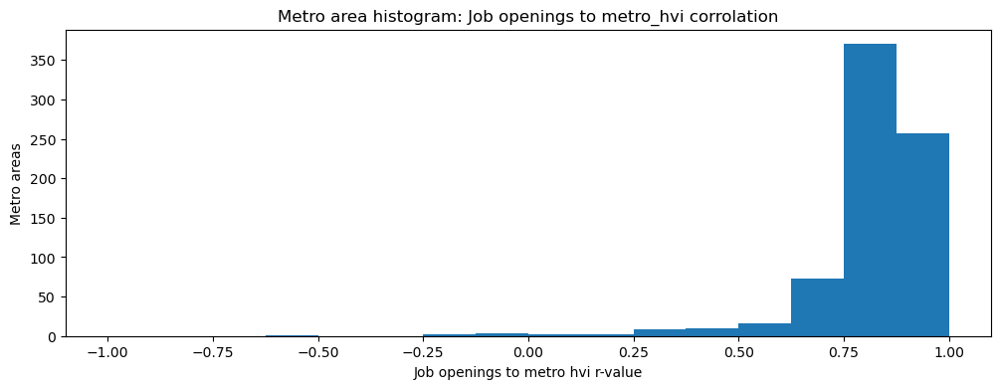

In [45]:
plt.figure(figsize=(12,4))
plt.hist(job_corr['corr'], bins=list(np.arange(-1,1+1/8,1/8)))
plt.xlabel('Job openings to metro hvi r-value')
plt.ylabel('Metro areas')
plt.title('Metro area histogram: Job openings to metro_hvi corrolation')

Text(0.5, 1.0, 'Metro area job opening correlation plotted against mean metro home values')

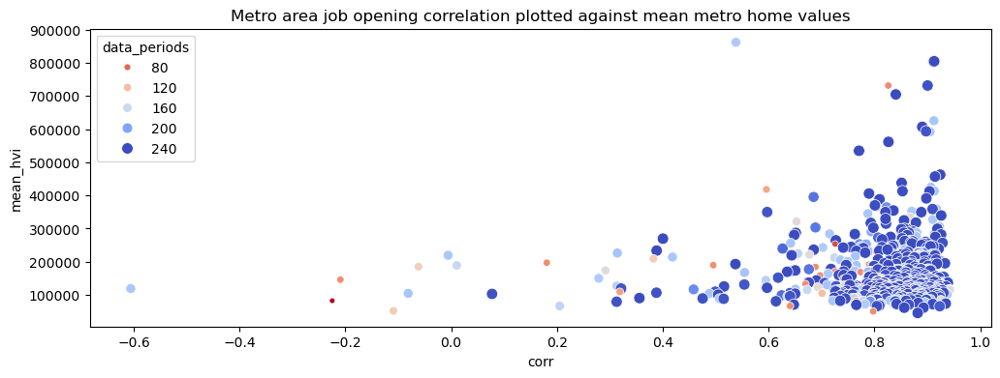

In [191]:
plt.figure(figsize=(12,4))
sns.scatterplot(data=job_corr, x='corr', y='mean_hvi',
                size='data_periods', hue='data_periods', palette=sns.color_palette("coolwarm_r", as_cmap=True))
plt.title('Metro area job opening correlation plotted against mean metro home values')

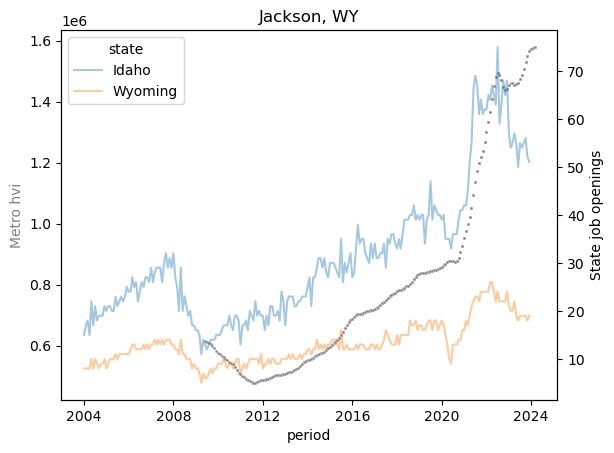

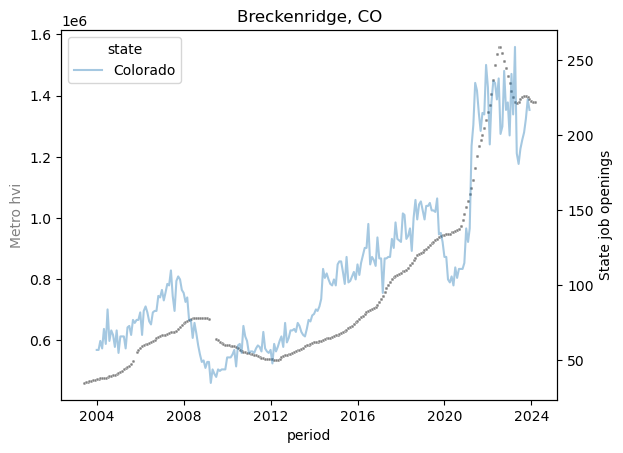

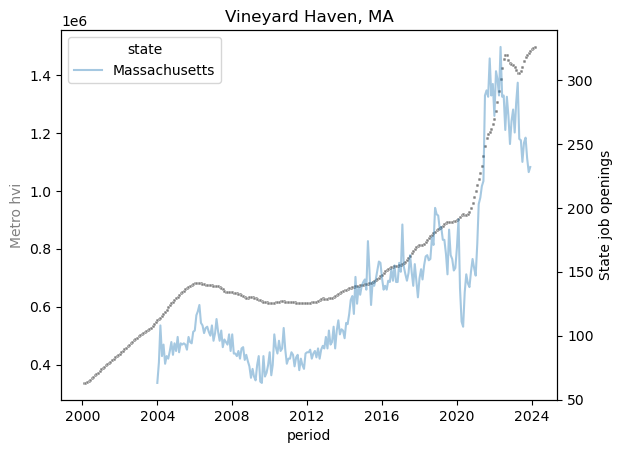

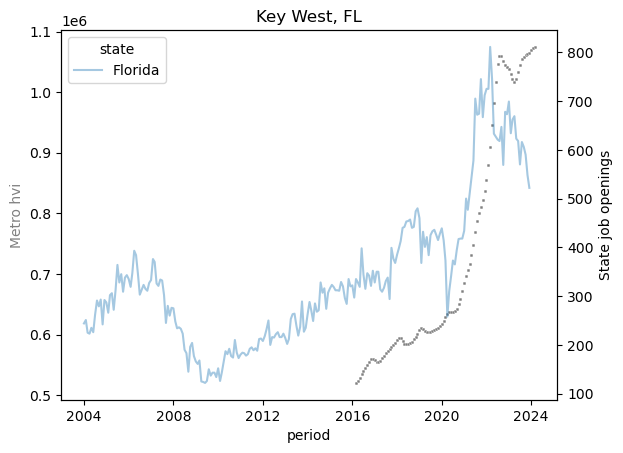

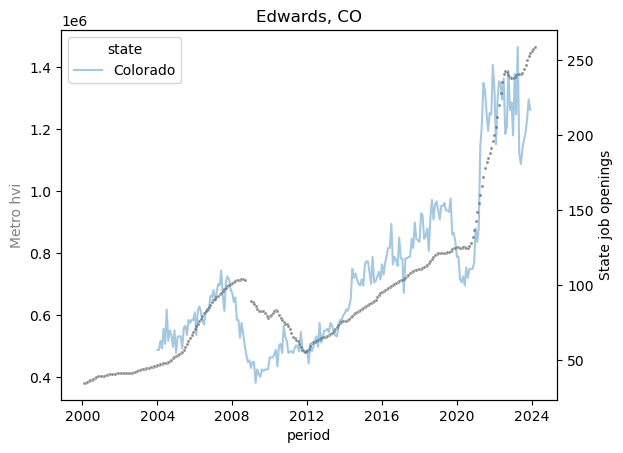

...

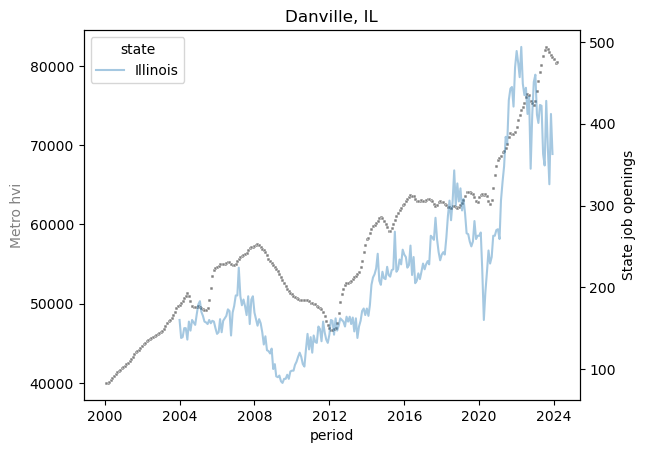

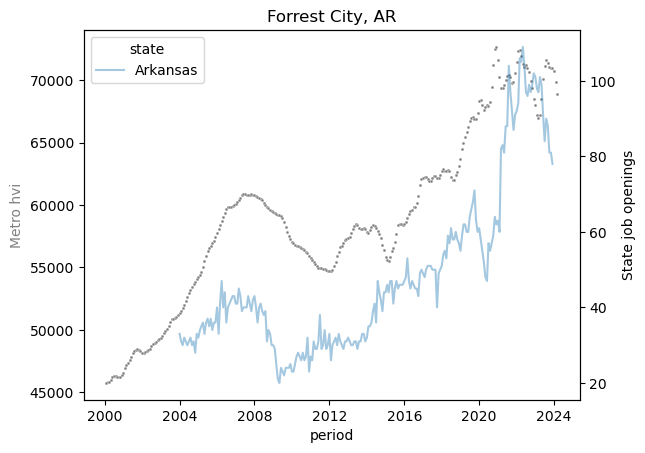

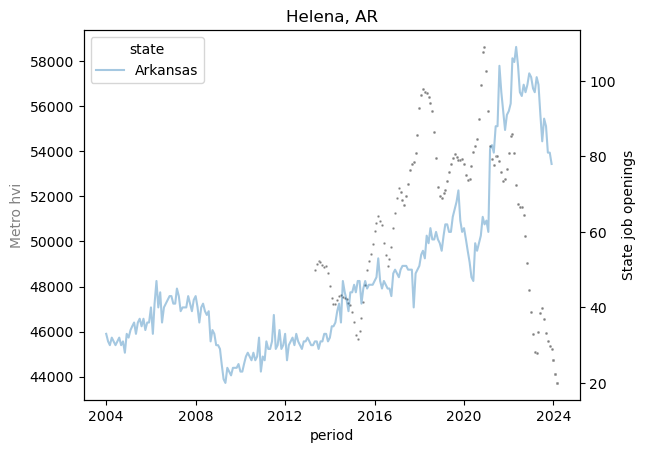

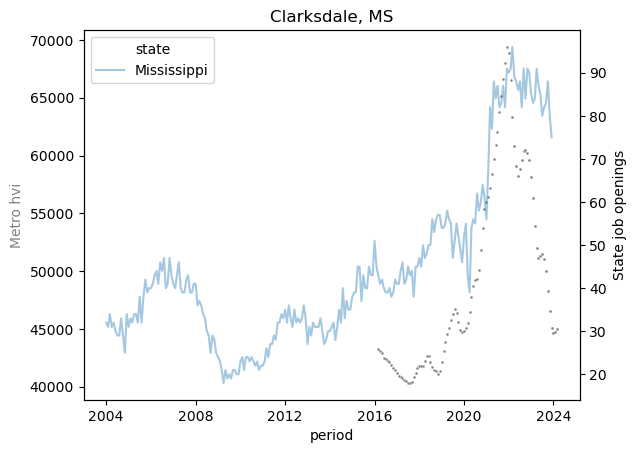

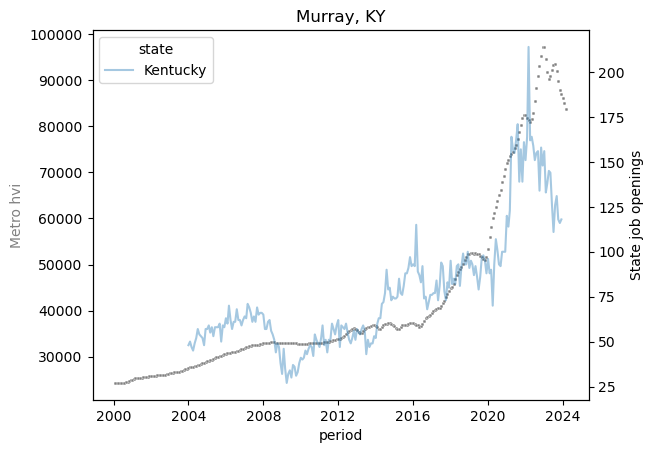

In [192]:
for metro in metros_review_df['metro_name']:
    df = zillow_merged[zillow_merged['metro_name'] == metro]
    state = df['state_name'].unique()
    
    ax1 = sns.scatterplot(data=df, x='period', y='metro_hvi', s=3, color='gray')
    ax1.set_ylabel('Metro hvi',color='gray')
    ax2 = plt.twinx()
    #sns.lineplot(data=jolts[jolts['state'].isin(state)], x='period_dt', y='state_job_openings_szn_adjd', color='black', label='Mean', estimator='mean', errorbar=None, alpha=.4)
    sns.lineplot(data=jolts[jolts['state'].isin(state)], x='period_dt', y='state_job_openings_szn_adjd', hue='state', alpha=.4)
    ax2.set_ylabel('State job openings')
    plt.title(metro)
    
    plt.show()

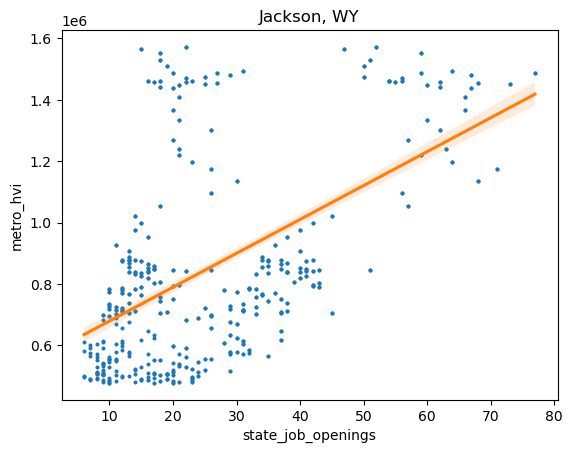

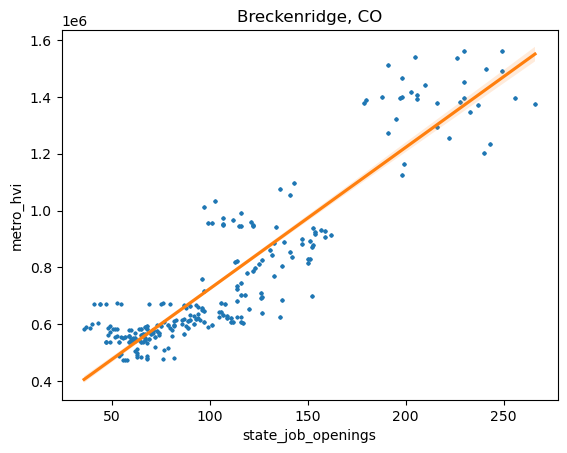

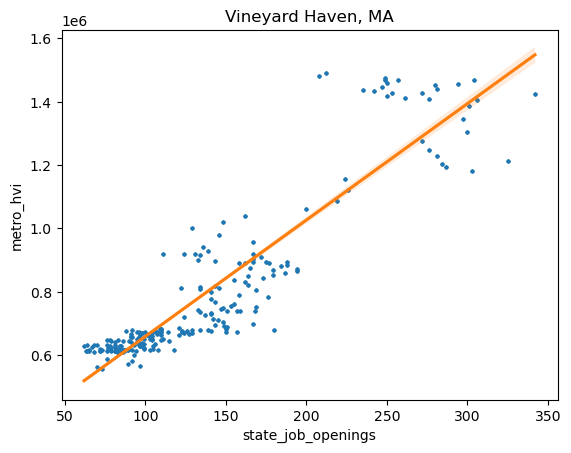

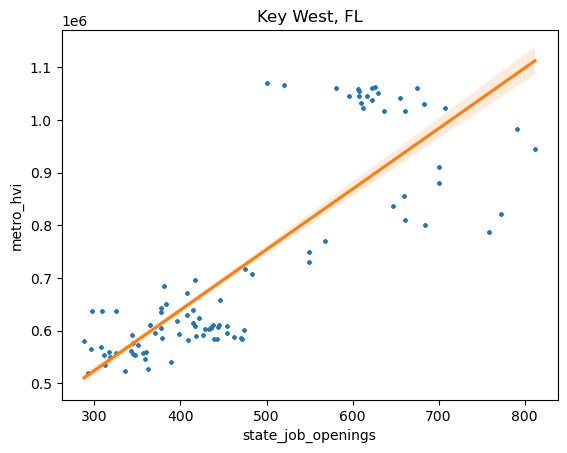

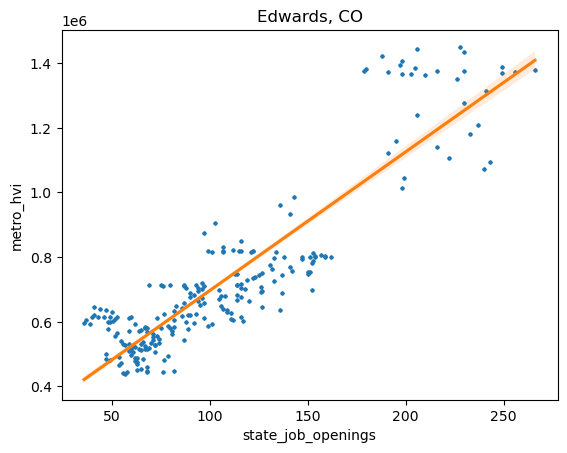

...

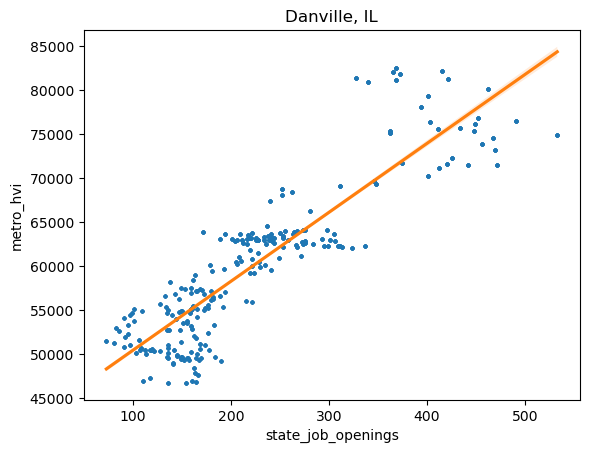

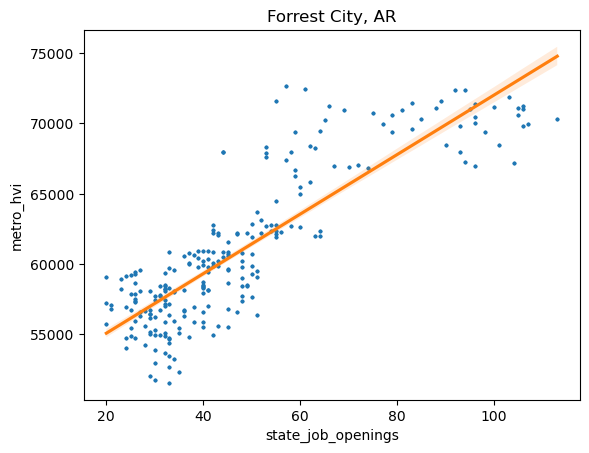

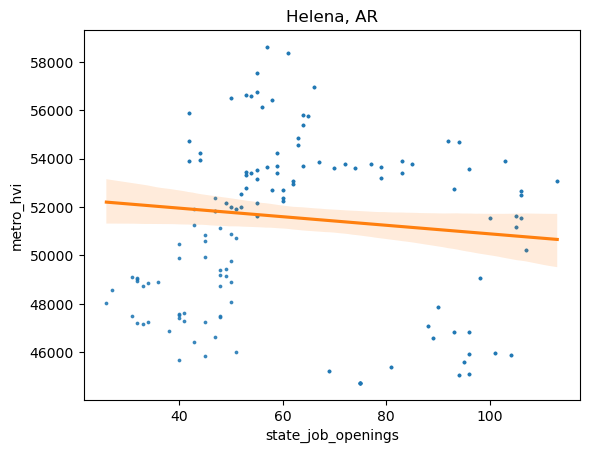

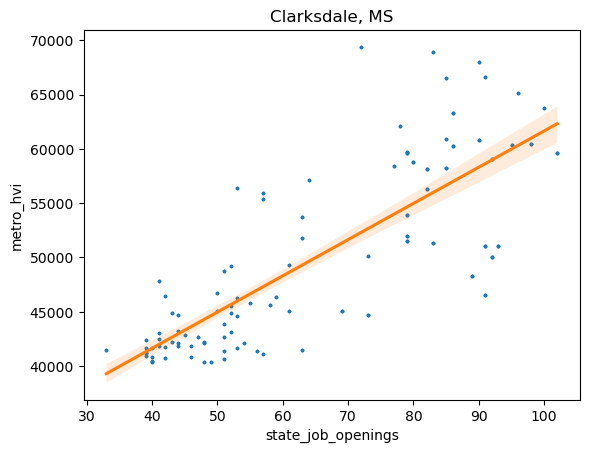

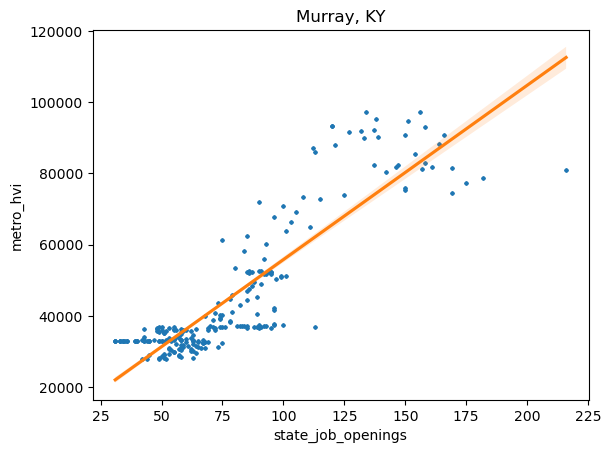

In [84]:
for metro in metros_review_df['metro_name']:
    df = zillow_merged[zillow_merged['metro_name'] == metro]
    
    ax1 = sns.regplot(data=df, x='state_job_openings', y='metro_hvi',line_kws={"color": "C1"}, scatter_kws={"s": 3})
    plt.title(metro)
    
    plt.show()

**Job openings are strongly corrolated to metro_hvi. There are several metro areas with lower corrolations, but the vast majority show moderate to strong corrolation.**